## Display All Videos for Reference

In [15]:
def mp4_to_html(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

### Pose 1

In [2]:
mp4_to_html('fed-pose1.mp4', width=480, height=360)

### Pose 2

In [3]:
mp4_to_html('fed-pose2.mp4', width=480, height=360)

### Pose 3

In [4]:
mp4_to_html('fed-pose3.mp4', width=480, height=360)

### Pose 4

In [5]:
mp4_to_html('fed-pose4.mp4', width=480, height=360)

### Pose 5

In [6]:
mp4_to_html('fed-pose5.mp4', width=480, height=360)

### Pose 1

In [7]:
mp4_to_html('djo-pose1.mp4', width=480, height=360)

### Pose 2

In [8]:
mp4_to_html('djo-pose2.mp4', width=480, height=360)

### Pose 3

In [9]:
mp4_to_html('djo-pose3.mp4', width=480, height=360)

### Pose 4

In [10]:
mp4_to_html('djo-pose4.mp4', width=480, height=360)

### Pose 5

In [11]:
mp4_to_html('djo-pose5.mp4', width=480, height=360)

## Analyze Pose Angles

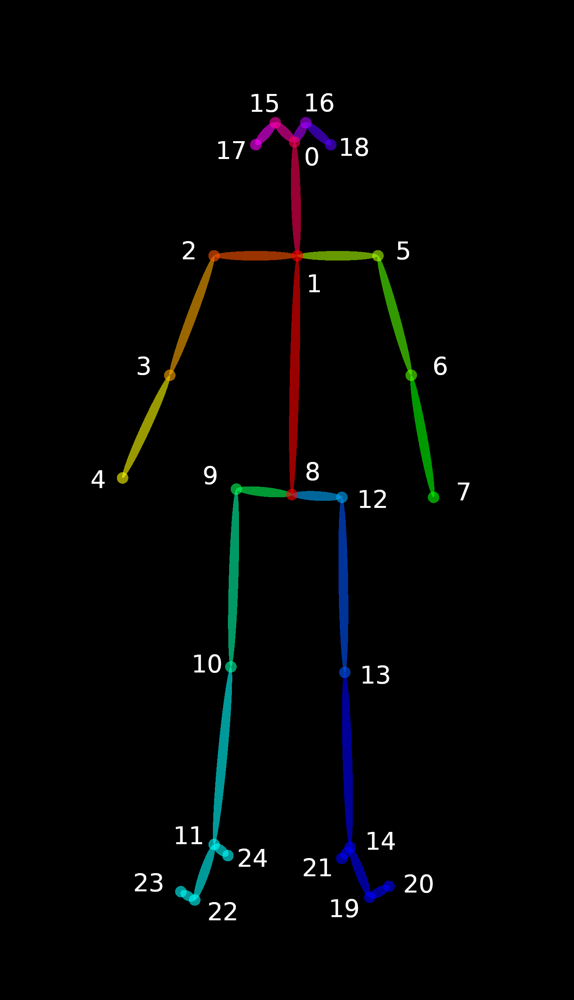

In [18]:
from IPython.display import Image
Image(filename='keypoints_pose_25.png',width=326,height=630.5) 

In [12]:
import os
import json
import matplotlib.pyplot as plt
import numpy as np
import math

from IPython.display import display

Number of frames: 60
Frames read: 60


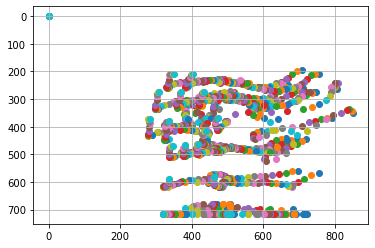

Frames with visible dominant arm: 53


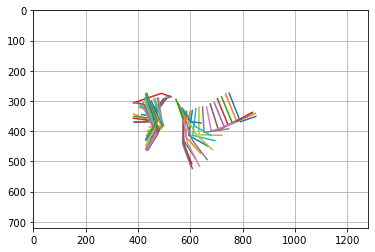

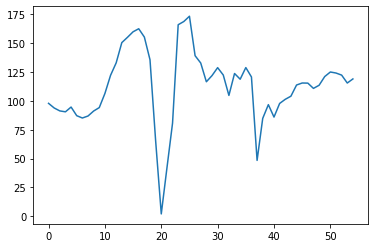

In [43]:
## Display Video
display(mp4_to_html('fed-pose1.mp4', width=480, height=360))

## Determine Filepath
filepath = './fed-pose1/openpose/short_output/'
files = os.listdir(filepath)
print("Number of frames:", len(files))

## Read for primary person's pose coordinates
xlimleft = 0
xlimright = 900
ylimtop = 720
ylimbot = 100

pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is in primary portion of the video...
        if xlimleft < keypoints[3] < xlimright and ylimbot < keypoints[4] < ylimtop:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

## Debugging
# print(data['people'])
# print(pose_coordinates)

## Scatter plot bodies to confirm only one body (otherwise, tuning the above parameters)
for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print("Frames read:", person_count)

# plt.xlim((-10,1300))
# plt.ylim((-10,800))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Plot arm and calculate arm angles
frames_with_arm = 0
for pose in pose_coordinates:
    if 0 not in pose_coordinates[pose]['x'][2:5]:
        plt.plot(pose_coordinates[pose]['x'][2:5], pose_coordinates[pose]['y'][2:5])
        frames_with_arm += 1

print("Frames with visible dominant arm:", frames_with_arm)
plt.xlim((0,1280))
plt.ylim((0,720))
plt.grid(visible=True)
plt.gca().invert_yaxis()
plt.show()

## Calculate Arm Angles
vector1_array = []
vector2_array = []
arm_angles1 = []

for pose in pose_coordinates:
    if pose_coordinates[pose]['x'][3] == 0 or pose_coordinates[pose]['x'][5] == 0 or pose_coordinates[pose]['x'][7] == 0:
        continue
    
    vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
    vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
    vector1_normal = vector1 / np.linalg.norm(vector1)
    vector2_normal = vector2 / np.linalg.norm(vector2)
    dot_product = np.dot(vector1_normal, vector2_normal)
    angle = math.degrees(np.arccos(dot_product))
    
    vector1_array.append(vector1_normal)
    vector2_array.append(vector2_normal)
    arm_angles1.append(angle)

# plt.plot(range(len(arm_angles)), arm_angles)
plt.plot(arm_angles1)
plt.show()

60
60


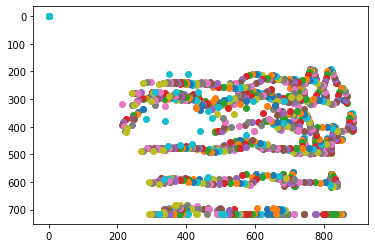

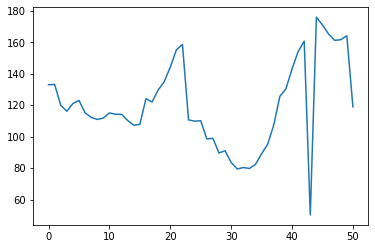

In [90]:
filepath = './fed-pose2/openpose/short_output/'
files = os.listdir(filepath)
print(len(files))

f = open(filepath + str(files[-1]))
data = json.load(f)
f.close()

pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if keypoints[3] < 900 and keypoints[4] > 100 and keypoints[3] != 0:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

# print(data['people'])
# print(pose_coordinates)

for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])
    # print(pose_coordinates[pose])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print(person_count)
plt.gca().invert_yaxis()
plt.show()

## Calculate Arm Angles
vector1_array = []
vector2_array = []
arm_angles2 = []

for pose in pose_coordinates:
    if pose_coordinates[pose]['x'][3] == 0 or pose_coordinates[pose]['x'][5] == 0 or pose_coordinates[pose]['x'][7] == 0:
        continue
    
    vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
    vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
    vector1_normal = vector1 / np.linalg.norm(vector1)
    vector2_normal = vector2 / np.linalg.norm(vector2)
    dot_product = np.dot(vector1_normal, vector2_normal)
    angle = math.degrees(np.arccos(dot_product))
    
    vector1_array.append(vector1_normal)
    vector2_array.append(vector2_normal)
    arm_angles2.append(angle)

# plt.plot(range(len(arm_angles)), arm_angles)
plt.plot(arm_angles2)
plt.show()

60
60


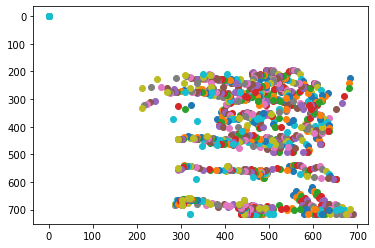

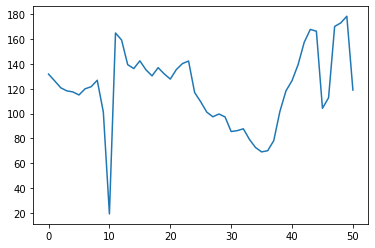

In [91]:
filepath = './fed-pose3/openpose/short_output/'
files = os.listdir(filepath)
print(len(files))

f = open(filepath + str(files[-1]))
data = json.load(f)
f.close()

pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if keypoints[3] < 900 and keypoints[4] > 100 and keypoints[3] != 0:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

# print(data['people'])
# print(pose_coordinates)

for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])
    # print(pose_coordinates[pose])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print(person_count)
plt.gca().invert_yaxis()
plt.show()

## Calculate Arm Angles
vector1_array = []
vector2_array = []
arm_angles3 = []

for pose in pose_coordinates:
    if pose_coordinates[pose]['x'][3] == 0 or pose_coordinates[pose]['x'][5] == 0 or pose_coordinates[pose]['x'][7] == 0:
        continue
    
    vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
    vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
    vector1_normal = vector1 / np.linalg.norm(vector1)
    vector2_normal = vector2 / np.linalg.norm(vector2)
    dot_product = np.dot(vector1_normal, vector2_normal)
    angle = math.degrees(np.arccos(dot_product))
    
    vector1_array.append(vector1_normal)
    vector2_array.append(vector2_normal)
    arm_angles3.append(angle)

# plt.plot(range(len(arm_angles)), arm_angles)
plt.plot(arm_angles3)
plt.show()

60
60


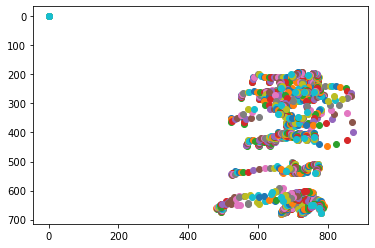

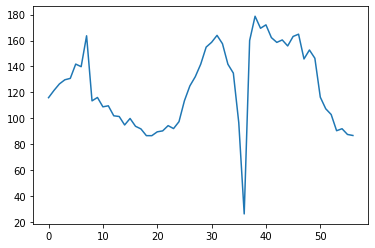

In [92]:
filepath = './fed-pose4/openpose/short_output/'
files = os.listdir(filepath)
print(len(files))

f = open(filepath + str(files[-1]))
data = json.load(f)
f.close()

pose_coordinates = {}
person_count = 0

for file in files:
    f = open(filepath + str(file))
    data = json.load(f)
    f.close()

    for person in data['people']:
        keypoints = person['pose_keypoints_2d']
        
        # If body is not in peripherary of the video...
        if keypoints[3] < 900 and keypoints[4] > 100 and keypoints[3] != 0:
            x = []
            y = []
            confidence = []
            for i in range(len(keypoints)):
                if i % 3 == 0:
                    x.append(keypoints[i])
                elif i % 3 == 1:
                    y.append(keypoints[i])
                else:
                    confidence.append(keypoints[i])
            pose_coordinates[person_count] = {}
            pose_coordinates[person_count]['x'] = x
            pose_coordinates[person_count]['y'] = y
            pose_coordinates[person_count]['confidence'] = confidence
            person_count += 1

# print(data['people'])
# print(pose_coordinates)

for pose in pose_coordinates:
    plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])
    # print(pose_coordinates[pose])

if person_count > len(files):
    plt.legend(range(person_count))
else:
    print(person_count)
plt.gca().invert_yaxis()
plt.show()

## Calculate Arm Angles
vector1_array = []
vector2_array = []
arm_angles4 = []

for pose in pose_coordinates:
    if pose_coordinates[pose]['x'][3] == 0 or pose_coordinates[pose]['x'][5] == 0 or pose_coordinates[pose]['x'][7] == 0:
        continue
    
    vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
    vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
    vector1_normal = vector1 / np.linalg.norm(vector1)
    vector2_normal = vector2 / np.linalg.norm(vector2)
    dot_product = np.dot(vector1_normal, vector2_normal)
    angle = math.degrees(np.arccos(dot_product))
    
    vector1_array.append(vector1_normal)
    vector2_array.append(vector2_normal)
    arm_angles4.append(angle)

# plt.plot(range(len(arm_angles)), arm_angles)
plt.plot(arm_angles4)
plt.show()

In [96]:
from statistics import mean
mean([mean(arm_angles1), mean(arm_angles2), mean(arm_angles3), mean(arm_angles4)])

119.05235341711368

In [ ]:
### filepath = './fed-pose5/openpose/short_output/'
# files = os.listdir(filepath)
# print(len(files))

# f = open(filepath + str(files[-1]))
# data = json.load(f)
# f.close()

# pose_coordinates = {}
# person_count = 0

# for file in files:
#     f = open(filepath + str(file))
#     data = json.load(f)
#     f.close()

#     for person in data['people']:
#         keypoints = person['pose_keypoints_2d']
        
#         # If body is not in peripherary of the video...
#         if keypoints[3] > 400 and keypoints[3] < 900 and keypoints[4] > 100 and keypoints[3] != 0:
#             x = []
#             y = []
#             confidence = []
#             for i in range(len(keypoints)):
#                 if i % 3 == 0:
#                     x.append(keypoints[i])
#                 elif i % 3 == 1:
#                     y.append(keypoints[i])
#                 else:
#                     confidence.append(keypoints[i])
#             pose_coordinates[person_count] = {}
#             pose_coordinates[person_count]['x'] = x
#             pose_coordinates[person_count]['y'] = y
#             pose_coordinates[person_count]['confidence'] = confidence
#             person_count += 1

# # print(data['people'])
# # print(pose_coordinates)

# for pose in pose_coordinates:
#     plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])
#     # print(pose_coordinates[pose])

# if person_count > len(files):
#     plt.legend(range(person_count))
# else:
#     print(person_count)
# plt.gca().invert_yaxis()
# plt.show()

# ## Calculate Arm Angles
# vector1_array = []
# vector2_array = []
# arm_angles = []

# for pose in pose_coordinates:
#     if pose_coordinates[pose]['x'][3] == 0 or pose_coordinates[pose]['x'][5] == 0 or pose_coordinates[pose]['x'][7] == 0:
#         continue
    
#     vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
#     vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
#     vector1_normal = vector1 / np.linalg.norm(vector1)
#     vector2_normal = vector2 / np.linalg.norm(vector2)
#     dot_product = np.dot(vector1_normal, vector2_normal)
#     angle = math.degrees(np.arccos(dot_product))
    
#     vector1_array.append(vector1_normal)
#     vector2_array.append(vector2_normal)
#     arm_angles.append(angle)

# # plt.plot(range(len(arm_angles)), arm_angles)
# plt.plot(arm_angles)
# plt.show()

120


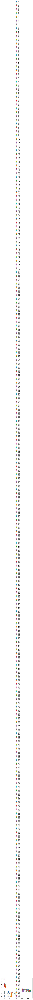

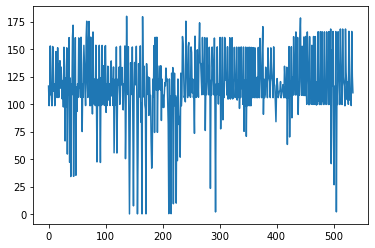

In [87]:
# filepath = './djo-pose2/openpose/short_output/'
# files = os.listdir(filepath)
# print(len(files))

# f = open(filepath + str(files[-1]))
# data = json.load(f)
# f.close()

# pose_coordinates = {}
# person_count = 0

# for file in files:
#     f = open(filepath + str(file))
#     data = json.load(f)
#     f.close()

#     for person in data['people']:
#         keypoints = person['pose_keypoints_2d']
        
#         # If body is not in peripherary of the video...
#         if keypoints[3] < 900 and keypoints[4] > 100 and keypoints[3] != 0:
#             x = []
#             y = []
#             confidence = []
#             for i in range(len(keypoints)):
#                 if i % 3 == 0:
#                     x.append(keypoints[i])
#                 elif i % 3 == 1:
#                     y.append(keypoints[i])
#                 else:
#                     confidence.append(keypoints[i])
#             pose_coordinates[person_count] = {}
#             pose_coordinates[person_count]['x'] = x
#             pose_coordinates[person_count]['y'] = y
#             pose_coordinates[person_count]['confidence'] = confidence
#             person_count += 1

# # print(data['people'])
# # print(pose_coordinates)

# for pose in pose_coordinates:
#     plt.scatter(pose_coordinates[pose]['x'],pose_coordinates[pose]['y'])
#     # print(pose_coordinates[pose])

# if person_count > len(files):
#     plt.legend(range(person_count))
# else:
#     print(person_count)
# plt.gca().invert_yaxis()
# plt.show()

# ## Calculate Arm Angles
# vector1_array = []
# vector2_array = []
# arm_angles = []

# for pose in pose_coordinates:
#     if pose_coordinates[pose]['x'][3] == 0 or pose_coordinates[pose]['x'][5] == 0 or pose_coordinates[pose]['x'][7] == 0:
#         continue
    
#     vector1 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][2], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][2]]
#     vector2 = [pose_coordinates[pose]['x'][3] - pose_coordinates[pose]['x'][4], pose_coordinates[pose]['y'][3] - pose_coordinates[pose]['y'][4]]
#     vector1_normal = vector1 / np.linalg.norm(vector1)
#     vector2_normal = vector2 / np.linalg.norm(vector2)
#     dot_product = np.dot(vector1_normal, vector2_normal)
#     angle = math.degrees(np.arccos(dot_product))
    
#     vector1_array.append(vector1_normal)
#     vector2_array.append(vector2_normal)
#     arm_angles.append(angle)

# # plt.plot(range(len(arm_angles)), arm_angles)
# plt.plot(arm_angles)
# plt.show()